<a href="https://colab.research.google.com/github/averymnelson/AI-sp25/blob/main/HW5/Homework5_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Assignment 5

This is an basecode for assignment 5 of Artificial Intelligence class (CSCE-4613), Spring 2025

In [17]:
import torch
import torchvision
import torch.nn as nn
from torchvision import transforms

from PIL import Image
import pickle
import matplotlib.pyplot as plt

In [18]:
import os
import numpy as np

# Get list of existing image files
image_paths = []
for i in range(1, 11):  # Assuming you have 10 images numbered 1-10
    image_name = f"image{i}.jpg"
    if os.path.exists(image_name):
        image_paths.append(image_name)

print(f"Found {len(image_paths)} images to analyze.")

Found 10 images to analyze.


## Question 1
### Define Input Transformation

In [19]:
MEAN = [0.485, 0.456, 0.406]
STD = [0.229, 0.224, 0.225]
IMAGE_SIZE = 224
image_transforms = transforms.Compose([
                           transforms.Resize(IMAGE_SIZE),
                           transforms.CenterCrop(IMAGE_SIZE),
                           transforms.ToTensor(),
                           transforms.Normalize(mean = MEAN, std = STD)])

index2name = pickle.load(open("imagenet_class_names.pkl", "rb"))


### Define Model

In [20]:
model_resnet50 = torchvision.models.resnet50(pretrained=True)
softmax_layer = nn.Softmax(dim=1)
model_resnet50.eval()

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

### Classify and Visualize Image

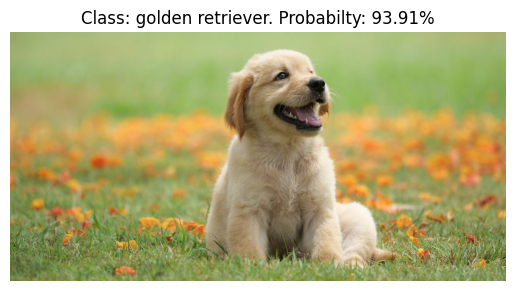

In [21]:
image_path = "dog.jpg"
original_image = Image.open(image_path).convert("RGB")
image = image_transforms(original_image)
image = image.unsqueeze(0)
output = softmax_layer(model_resnet50(image))

prediction = torch.argmax(output, dim=1).item()
prob = output[0, prediction].item() * 100
predicted_name = index2name[prediction]

plt.imshow(original_image)
plt.title("Class: %s. Probabilty: %.2f" % (predicted_name, prob) + "%")
plt.axis("off")
plt.show()

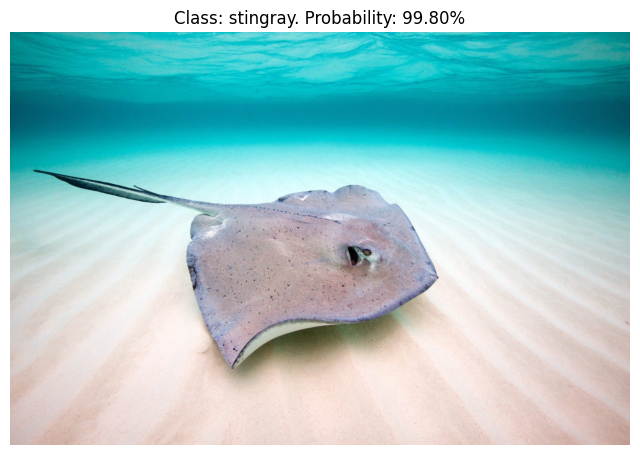

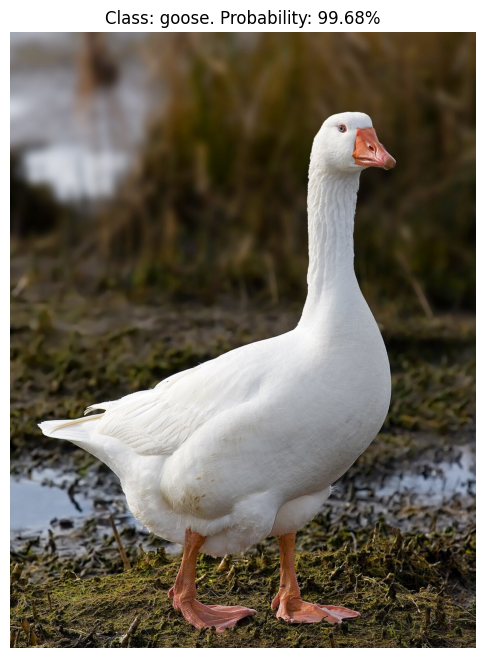

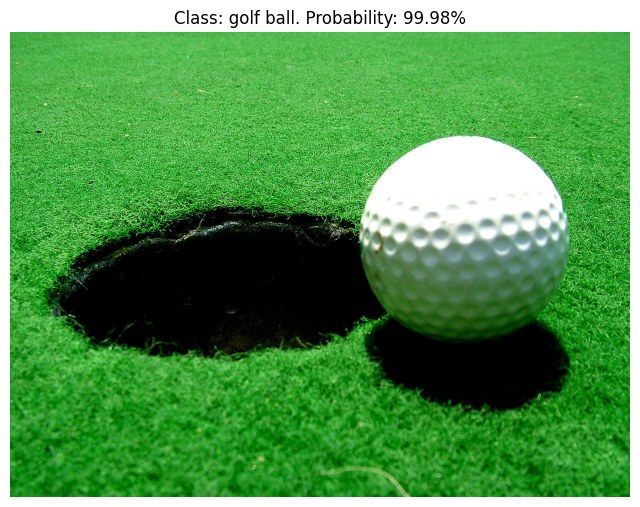

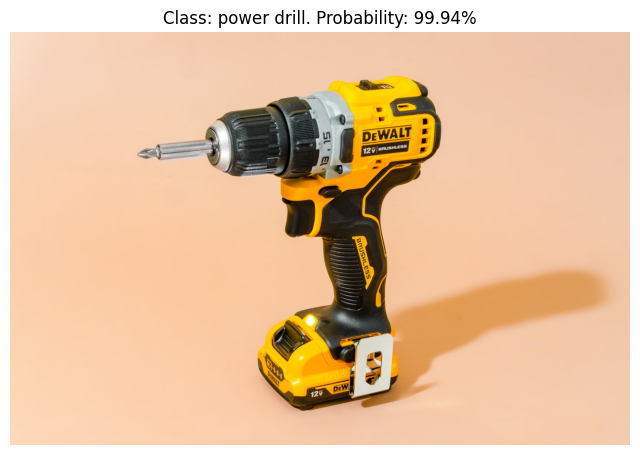

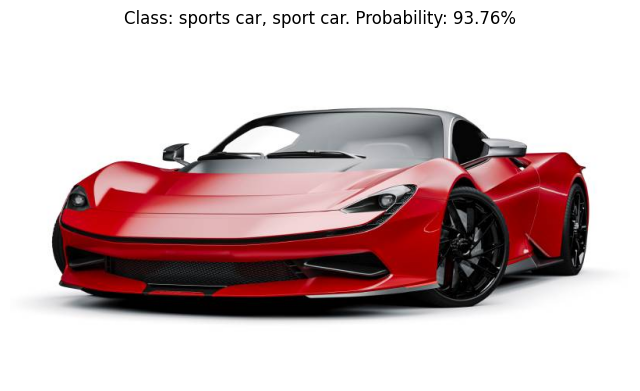

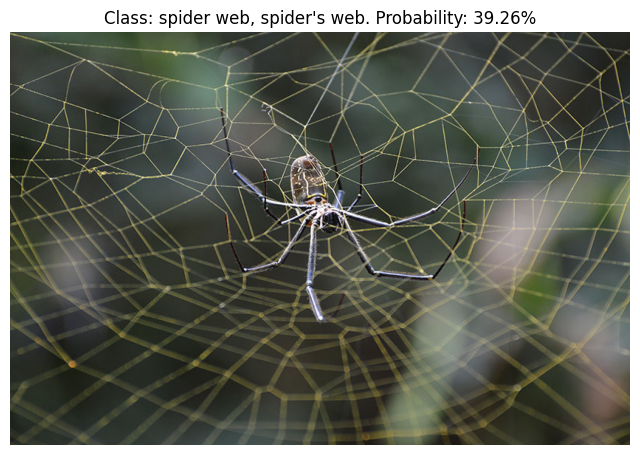

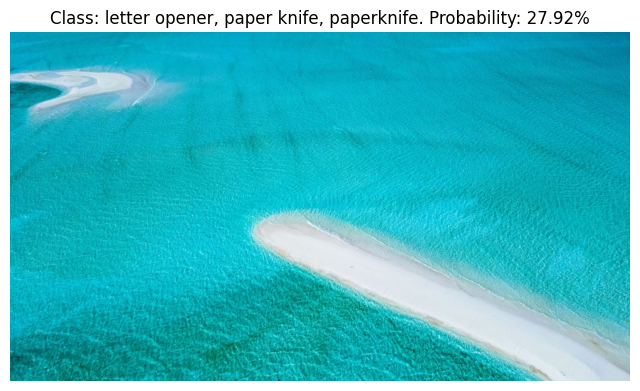

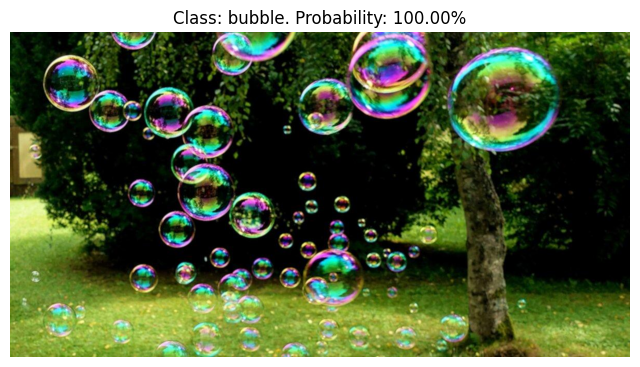

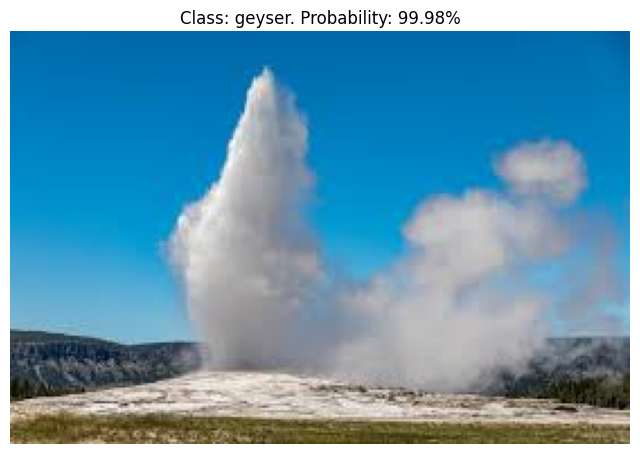

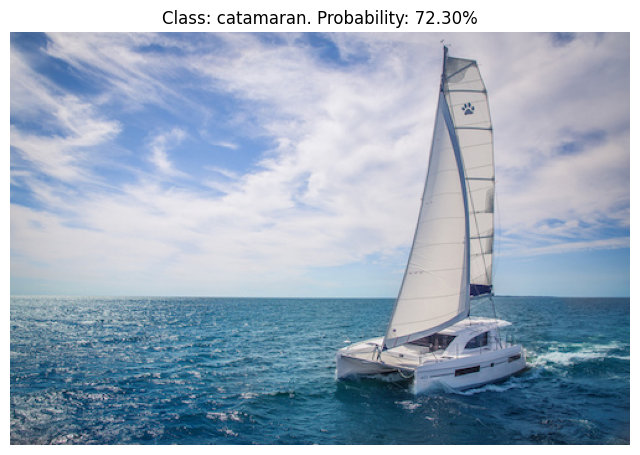

In [22]:
def classify_and_visualize_resnet50(image_path):
    # Load the image
    original_image = Image.open(image_path).convert("RGB")

    # Transform the image
    image = image_transforms(original_image)
    image = image.unsqueeze(0)

    # Forward through the model
    output = softmax_layer(model_resnet50(image))

    # Get the top prediction
    prediction = torch.argmax(output, dim=1).item()
    prob = output[0, prediction].item() * 100
    predicted_name = index2name[prediction]

    # Visualize
    plt.figure(figsize=(8, 8))
    plt.imshow(original_image)
    plt.title("Class: %s. Probability: %.2f" % (predicted_name, prob) + "%")
    plt.axis("off")
    plt.show()

    return output

# Process all the downloaded images with ResNet-50
model_resnet50 = torchvision.models.resnet50(pretrained=True)
softmax_layer = nn.Softmax(dim=1)
model_resnet50.eval()

for image_path in image_paths:
    output = classify_and_visualize_resnet50(image_path)

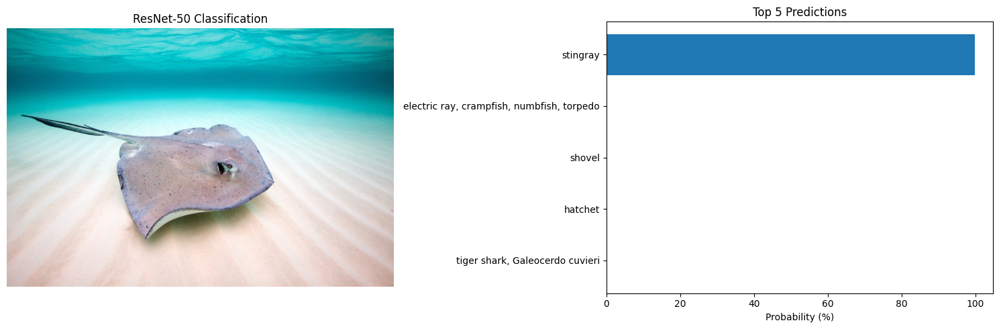

Top 5 predictions for image1.jpg using ResNet-50:
1. stingray - 99.80%
2. electric ray, crampfish, numbfish, torpedo - 0.20%
3. shovel - 0.00%
4. hatchet - 0.00%
5. tiger shark, Galeocerdo cuvieri - 0.00%


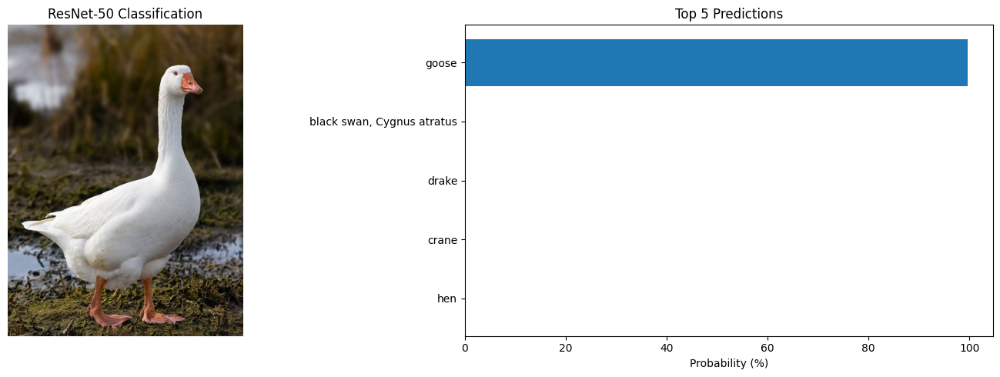

Top 5 predictions for image2.jpg using ResNet-50:
1. goose - 99.68%
2. black swan, Cygnus atratus - 0.15%
3. drake - 0.05%
4. crane - 0.03%
5. hen - 0.02%


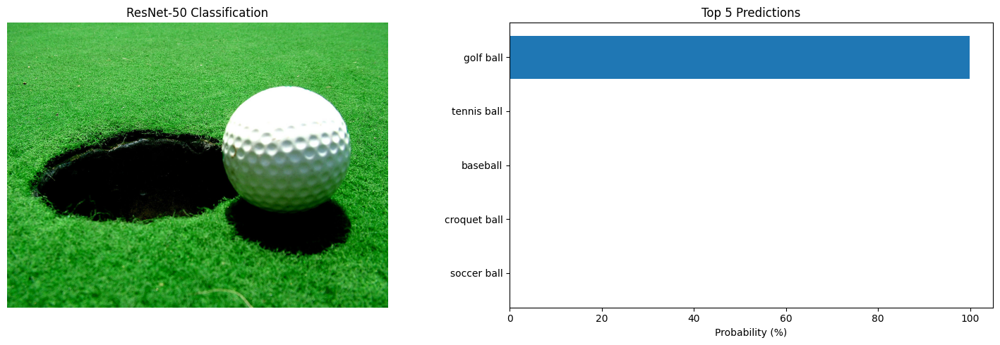

Top 5 predictions for image3.jpg using ResNet-50:
1. golf ball - 99.98%
2. tennis ball - 0.01%
3. baseball - 0.01%
4. croquet ball - 0.00%
5. soccer ball - 0.00%


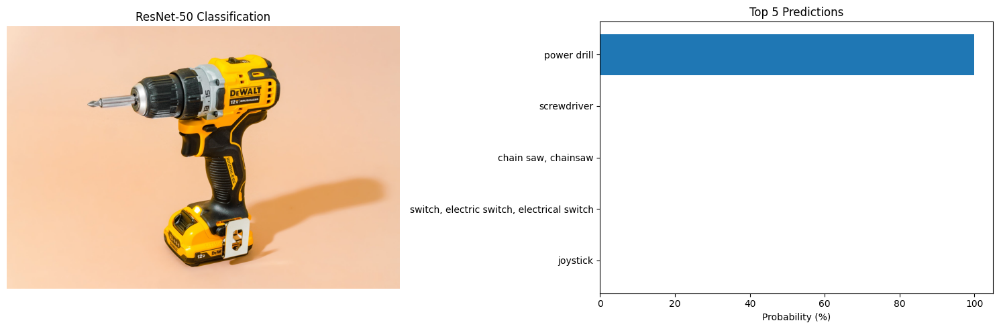

Top 5 predictions for image4.jpg using ResNet-50:
1. power drill - 99.94%
2. screwdriver - 0.03%
3. chain saw, chainsaw - 0.02%
4. switch, electric switch, electrical switch - 0.00%
5. joystick - 0.00%


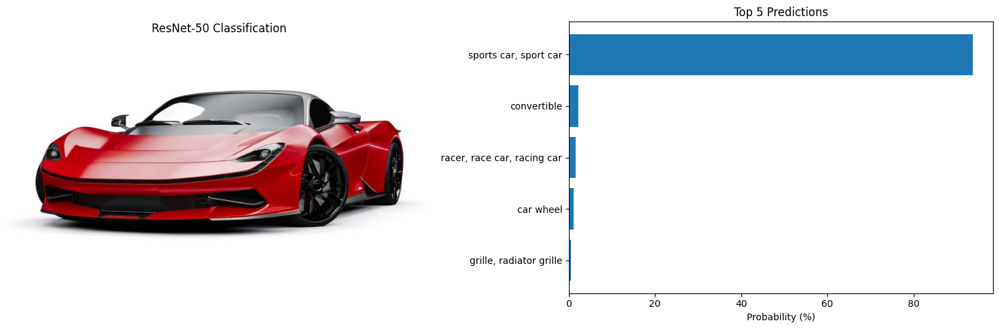

Top 5 predictions for image5.jpg using ResNet-50:
1. sports car, sport car - 93.76%
2. convertible - 2.18%
3. racer, race car, racing car - 1.62%
4. car wheel - 1.18%
5. grille, radiator grille - 0.61%


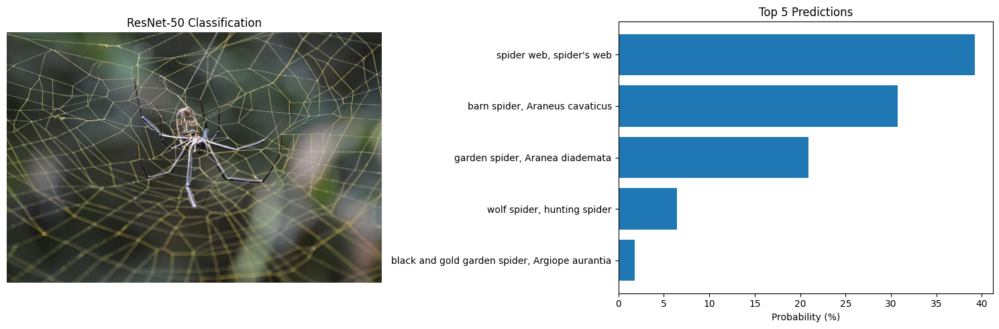

Top 5 predictions for image6.jpg using ResNet-50:
1. spider web, spider's web - 39.26%
2. barn spider, Araneus cavaticus - 30.73%
3. garden spider, Aranea diademata - 20.93%
4. wolf spider, hunting spider - 6.45%
5. black and gold garden spider, Argiope aurantia - 1.81%


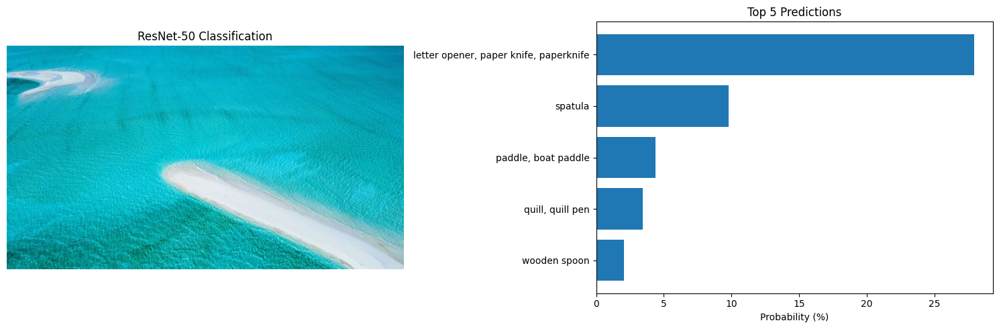

Top 5 predictions for image7.jpg using ResNet-50:
1. letter opener, paper knife, paperknife - 27.92%
2. spatula - 9.81%
3. paddle, boat paddle - 4.40%
4. quill, quill pen - 3.46%
5. wooden spoon - 2.05%


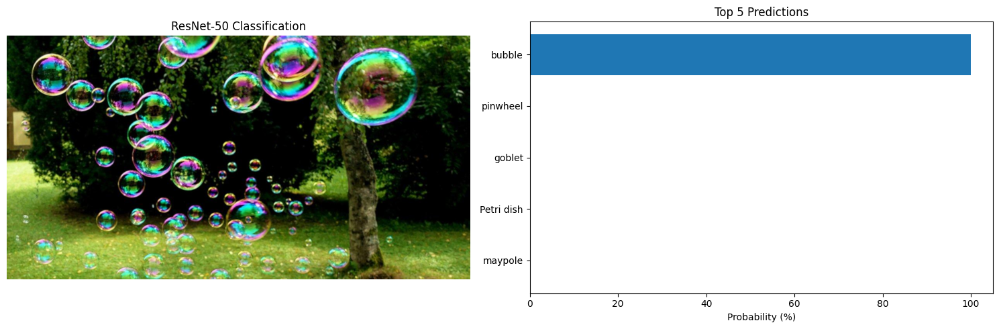

Top 5 predictions for image8.jpg using ResNet-50:
1. bubble - 100.00%
2. pinwheel - 0.00%
3. goblet - 0.00%
4. Petri dish - 0.00%
5. maypole - 0.00%


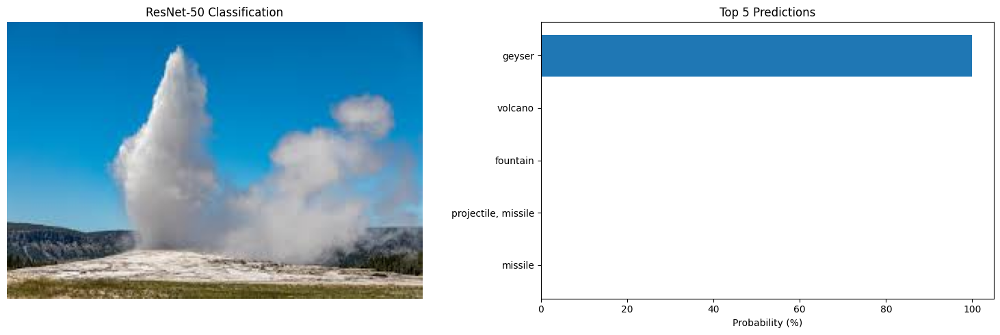

Top 5 predictions for image9.jpg using ResNet-50:
1. geyser - 99.98%
2. volcano - 0.01%
3. fountain - 0.00%
4. projectile, missile - 0.00%
5. missile - 0.00%


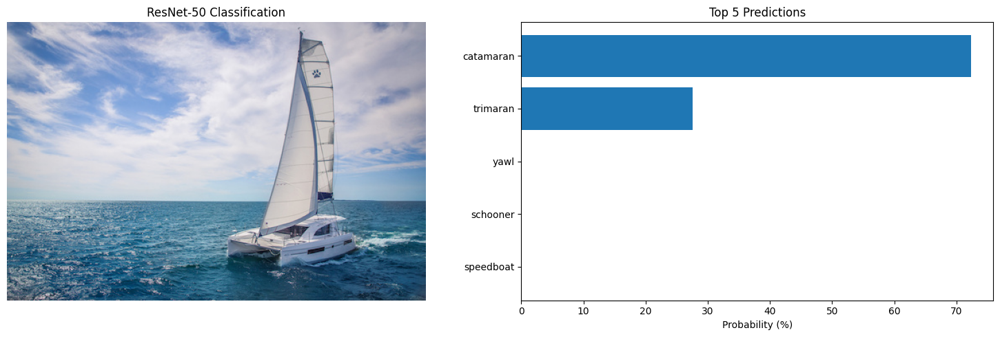

Top 5 predictions for image10.jpg using ResNet-50:
1. catamaran - 72.30%
2. trimaran - 27.57%
3. yawl - 0.08%
4. schooner - 0.04%
5. speedboat - 0.00%


In [23]:
def visualize_top5_predictions(image_path, model, model_name="ResNet-50"):
    # Load the image
    original_image = Image.open(image_path).convert("RGB")

    # Transform the image
    image = image_transforms(original_image)
    image = image.unsqueeze(0)

    # Forward through the model
    output = softmax_layer(model(image))

    # Get top-5 predictions
    K = 5
    top_k_values, top_k_indices = torch.topk(output, K, dim=1)
    top_k_probs = top_k_values[0].tolist()
    top_k_classes = top_k_indices[0].tolist()

    # Create a figure with 2 subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    # Display the image
    ax1.imshow(original_image)
    ax1.set_title(f"{model_name} Classification")
    ax1.axis("off")

    # Display the top-5 predictions as a bar chart
    class_names = [index2name[idx] for idx in top_k_classes]
    probabilities = [prob * 100 for prob in top_k_probs]

    y_pos = np.arange(len(class_names))
    ax2.barh(y_pos, probabilities, align='center')
    ax2.set_yticks(y_pos)
    ax2.set_yticklabels(class_names)
    ax2.set_xlabel('Probability (%)')
    ax2.set_title(f'Top {K} Predictions')
    ax2.invert_yaxis()  # Highest probability at the top

    plt.tight_layout()
    plt.show()

    # Also print the predictions
    print(f"Top {K} predictions for {os.path.basename(image_path)} using {model_name}:")
    for i in range(K):
        print(f"{i+1}. {class_names[i]} - {probabilities[i]:.2f}%")

# Process all the downloaded images with top-5 visualizations
for image_path in image_paths:
    visualize_top5_predictions(image_path, model_resnet50, "ResNet-50")

# ResNet-101

In [24]:
model_resnet101 = torchvision.models.resnet101(pretrained=True)
softmax_layer = nn.Softmax(dim=1)
model_resnet101.eval()

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

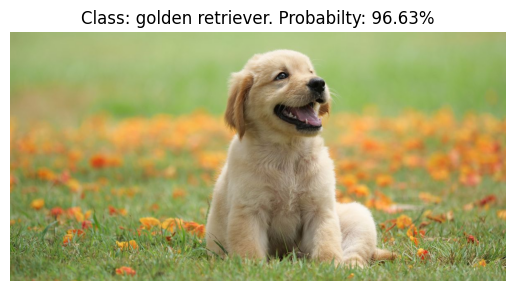

In [25]:
image_path = "dog.jpg"
original_image = Image.open(image_path).convert("RGB")
image = image_transforms(original_image)
image = image.unsqueeze(0)
output = softmax_layer(model_resnet101(image))

prediction = torch.argmax(output, dim=1).item()
prob = output[0, prediction].item() * 100
predicted_name = index2name[prediction]

plt.imshow(original_image)
plt.title("Class: %s. Probabilty: %.2f" % (predicted_name, prob) + "%")
plt.axis("off")
plt.show()

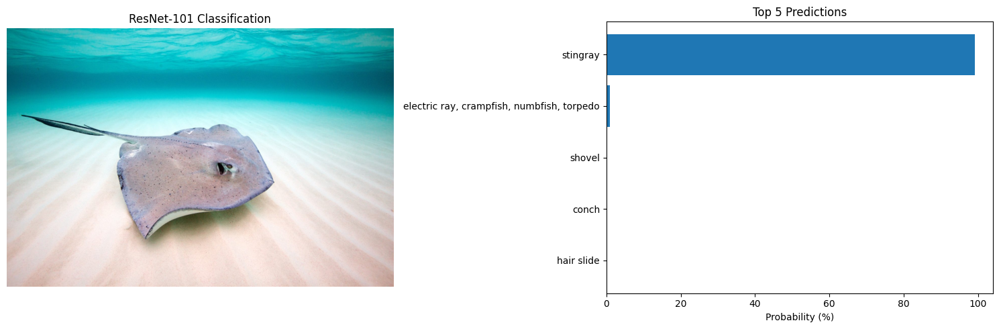

Top 5 predictions for image1.jpg using ResNet-101:
1. stingray - 99.09%
2. electric ray, crampfish, numbfish, torpedo - 0.90%
3. shovel - 0.00%
4. conch - 0.00%
5. hair slide - 0.00%


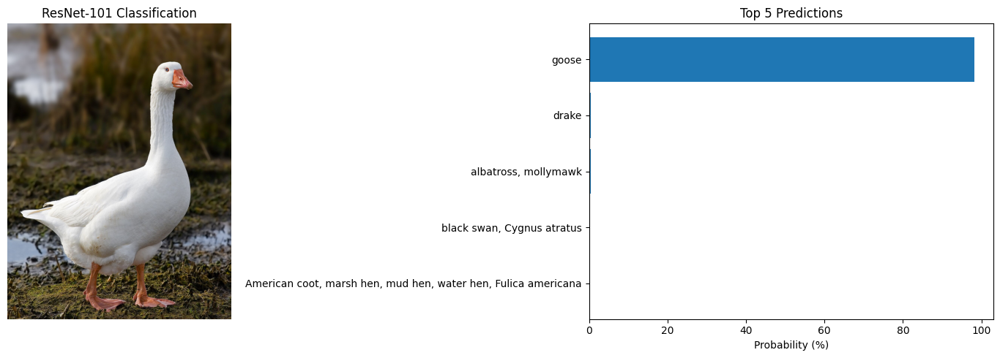

Top 5 predictions for image2.jpg using ResNet-101:
1. goose - 98.10%
2. drake - 0.49%
3. albatross, mollymawk - 0.37%
4. black swan, Cygnus atratus - 0.28%
5. American coot, marsh hen, mud hen, water hen, Fulica americana - 0.15%


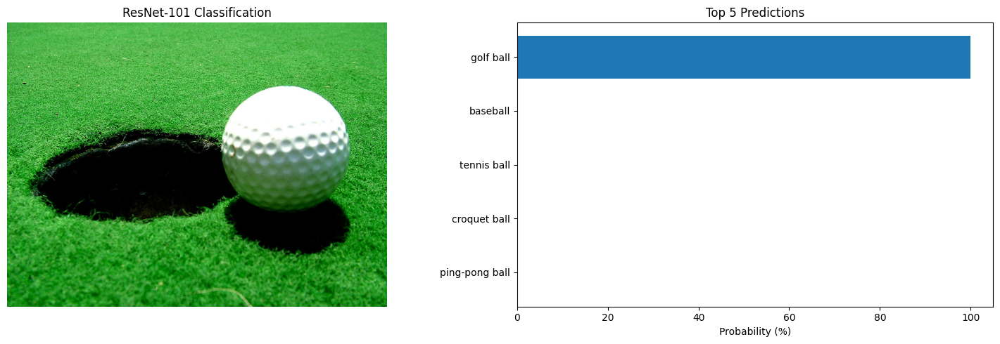

Top 5 predictions for image3.jpg using ResNet-101:
1. golf ball - 99.99%
2. baseball - 0.00%
3. tennis ball - 0.00%
4. croquet ball - 0.00%
5. ping-pong ball - 0.00%


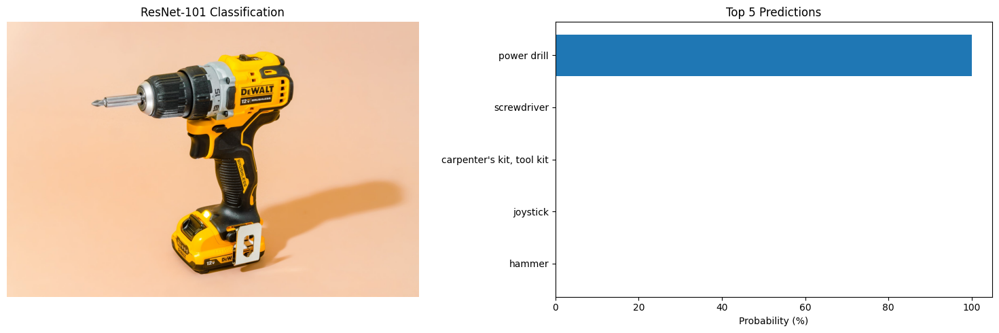

Top 5 predictions for image4.jpg using ResNet-101:
1. power drill - 99.99%
2. screwdriver - 0.01%
3. carpenter's kit, tool kit - 0.00%
4. joystick - 0.00%
5. hammer - 0.00%


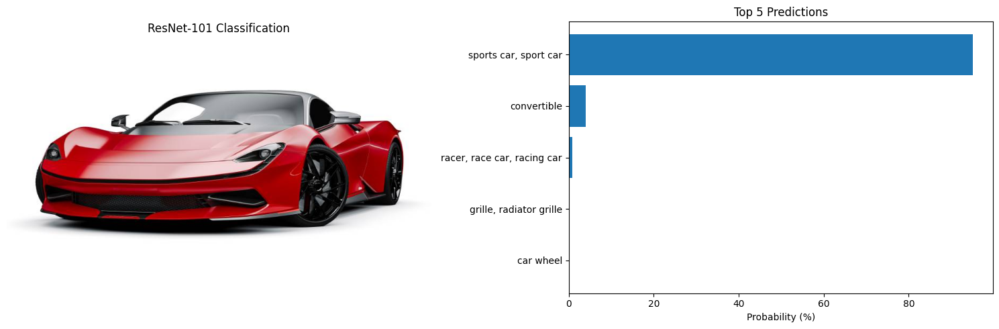

Top 5 predictions for image5.jpg using ResNet-101:
1. sports car, sport car - 95.09%
2. convertible - 3.97%
3. racer, race car, racing car - 0.83%
4. grille, radiator grille - 0.05%
5. car wheel - 0.04%


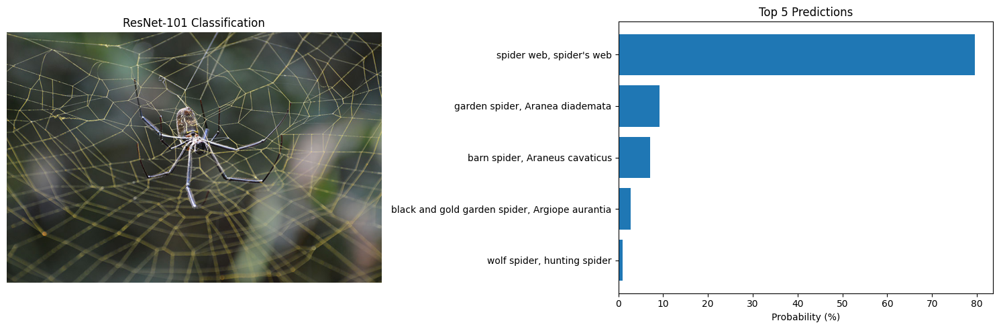

Top 5 predictions for image6.jpg using ResNet-101:
1. spider web, spider's web - 79.62%
2. garden spider, Aranea diademata - 9.26%
3. barn spider, Araneus cavaticus - 7.04%
4. black and gold garden spider, Argiope aurantia - 2.69%
5. wolf spider, hunting spider - 0.95%


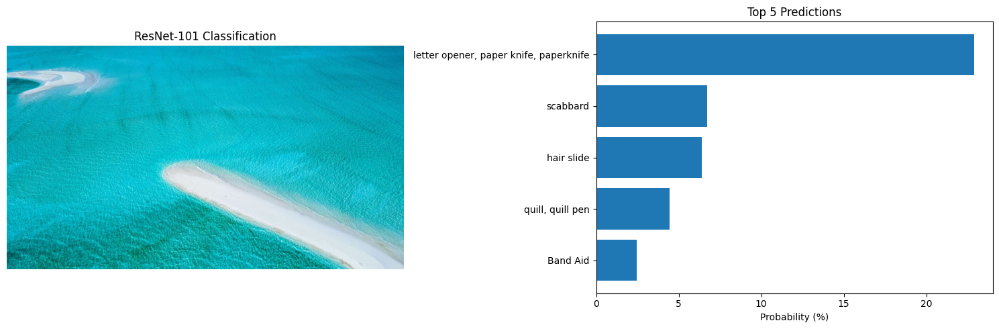

Top 5 predictions for image7.jpg using ResNet-101:
1. letter opener, paper knife, paperknife - 22.90%
2. scabbard - 6.74%
3. hair slide - 6.39%
4. quill, quill pen - 4.43%
5. Band Aid - 2.44%


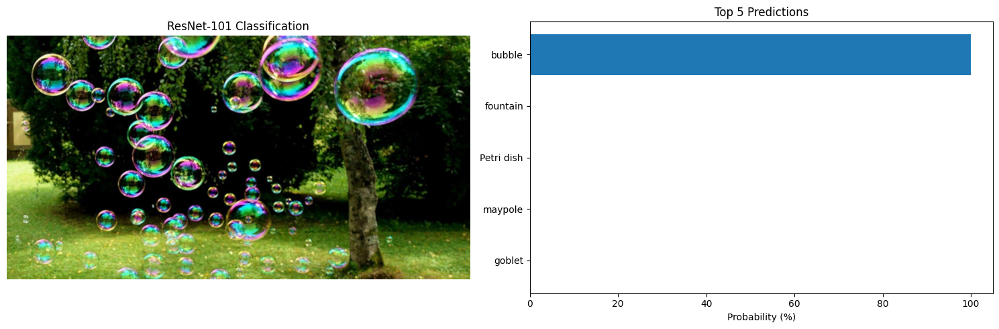

Top 5 predictions for image8.jpg using ResNet-101:
1. bubble - 100.00%
2. fountain - 0.00%
3. Petri dish - 0.00%
4. maypole - 0.00%
5. goblet - 0.00%


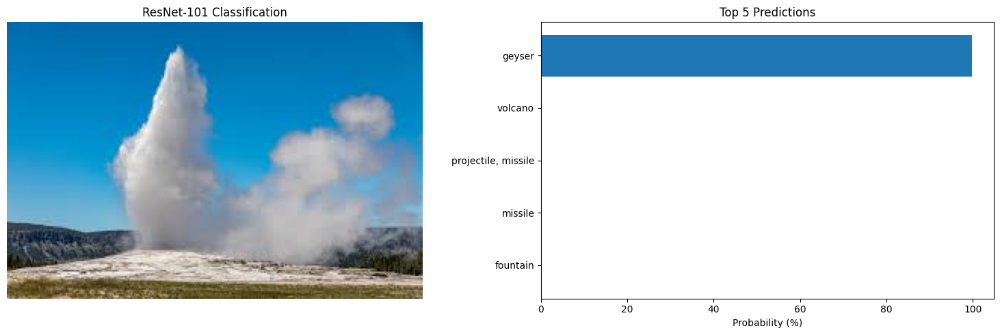

Top 5 predictions for image9.jpg using ResNet-101:
1. geyser - 99.86%
2. volcano - 0.11%
3. projectile, missile - 0.01%
4. missile - 0.00%
5. fountain - 0.00%


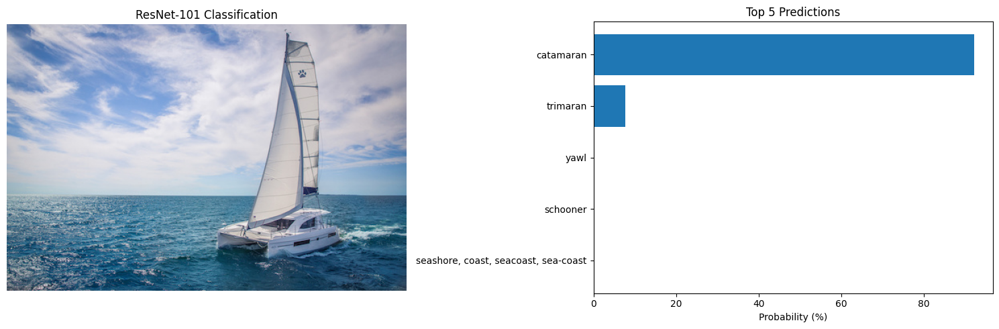

Top 5 predictions for image10.jpg using ResNet-101:
1. catamaran - 92.15%
2. trimaran - 7.76%
3. yawl - 0.04%
4. schooner - 0.02%
5. seashore, coast, seacoast, sea-coast - 0.00%


In [26]:
# Process all images with ResNet-101
for image_path in image_paths:
    visualize_top5_predictions(image_path, model_resnet101, "ResNet-101")

# DenseNet-121

In [27]:
model_densenet121 = torchvision.models.densenet121(pretrained=True)
softmax_layer = nn.Softmax(dim=1)
model_densenet121.eval()

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

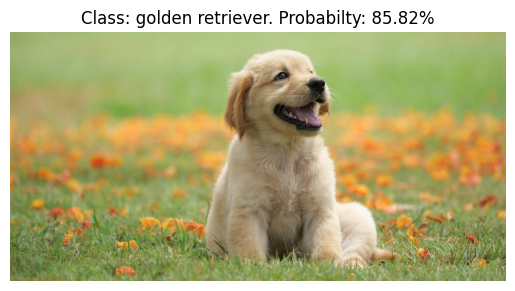

In [28]:
image_path = "dog.jpg"
original_image = Image.open(image_path).convert("RGB")
image = image_transforms(original_image)
image = image.unsqueeze(0)
output = softmax_layer(model_densenet121(image))

prediction = torch.argmax(output, dim=1).item()
prob = output[0, prediction].item() * 100
predicted_name = index2name[prediction]

plt.imshow(original_image)
plt.title("Class: %s. Probabilty: %.2f" % (predicted_name, prob) + "%")
plt.axis("off")
plt.show()

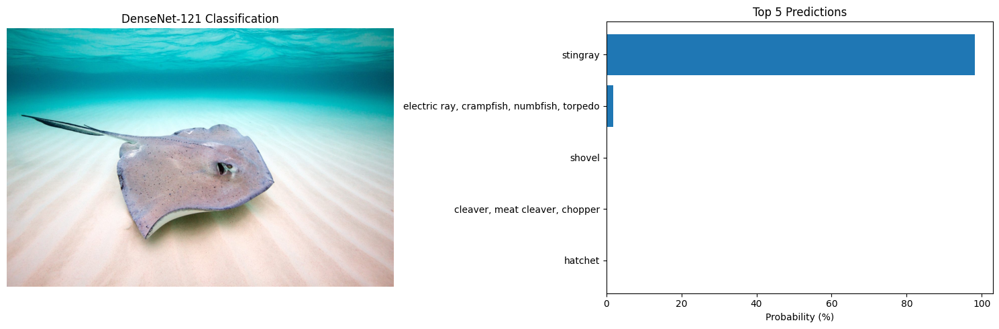

Top 5 predictions for image1.jpg using DenseNet-121:
1. stingray - 98.08%
2. electric ray, crampfish, numbfish, torpedo - 1.90%
3. shovel - 0.01%
4. cleaver, meat cleaver, chopper - 0.00%
5. hatchet - 0.00%


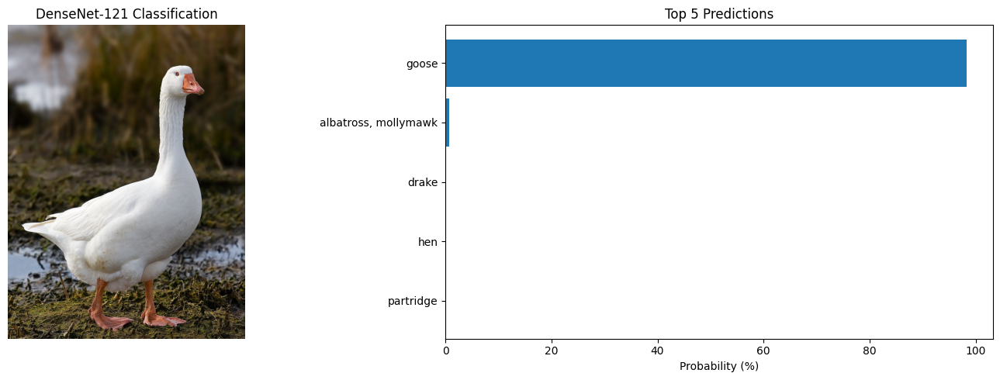

Top 5 predictions for image2.jpg using DenseNet-121:
1. goose - 98.32%
2. albatross, mollymawk - 0.77%
3. drake - 0.15%
4. hen - 0.11%
5. partridge - 0.10%


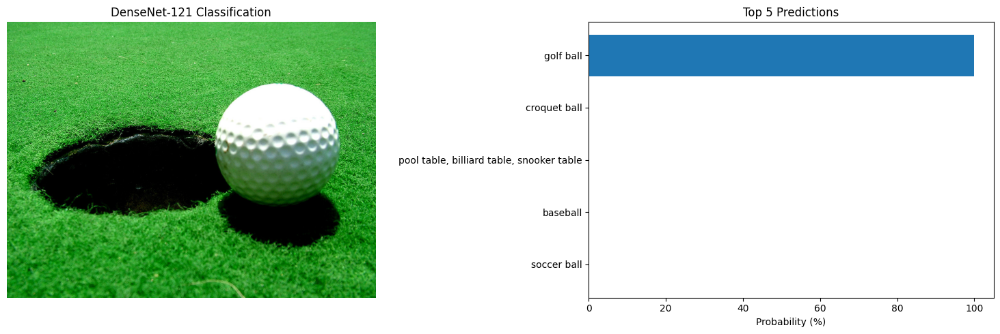

Top 5 predictions for image3.jpg using DenseNet-121:
1. golf ball - 100.00%
2. croquet ball - 0.00%
3. pool table, billiard table, snooker table - 0.00%
4. baseball - 0.00%
5. soccer ball - 0.00%


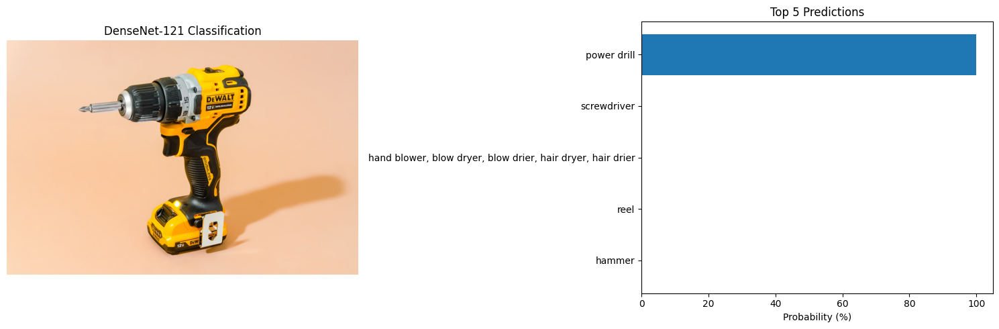

Top 5 predictions for image4.jpg using DenseNet-121:
1. power drill - 99.97%
2. screwdriver - 0.02%
3. hand blower, blow dryer, blow drier, hair dryer, hair drier - 0.00%
4. reel - 0.00%
5. hammer - 0.00%


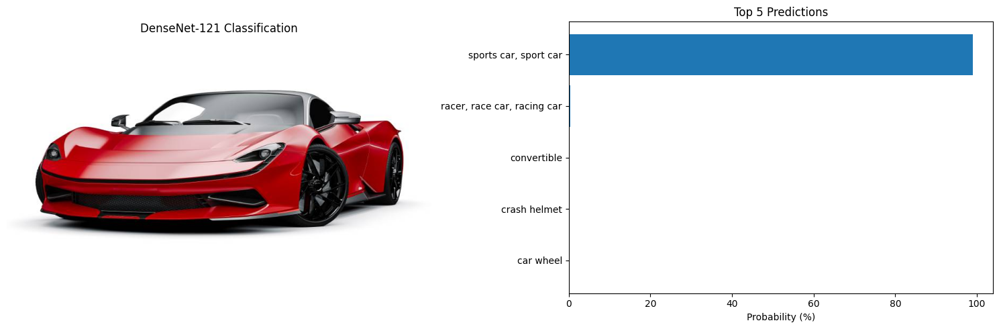

Top 5 predictions for image5.jpg using DenseNet-121:
1. sports car, sport car - 98.99%
2. racer, race car, racing car - 0.34%
3. convertible - 0.27%
4. crash helmet - 0.20%
5. car wheel - 0.11%


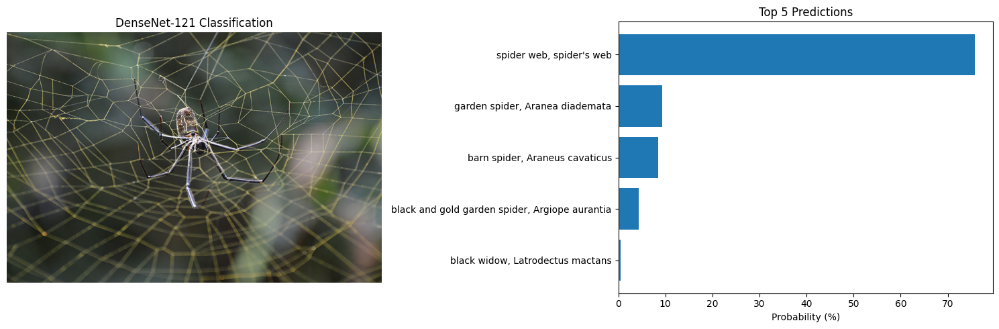

Top 5 predictions for image6.jpg using DenseNet-121:
1. spider web, spider's web - 75.83%
2. garden spider, Aranea diademata - 9.27%
3. barn spider, Araneus cavaticus - 8.49%
4. black and gold garden spider, Argiope aurantia - 4.29%
5. black widow, Latrodectus mactans - 0.55%


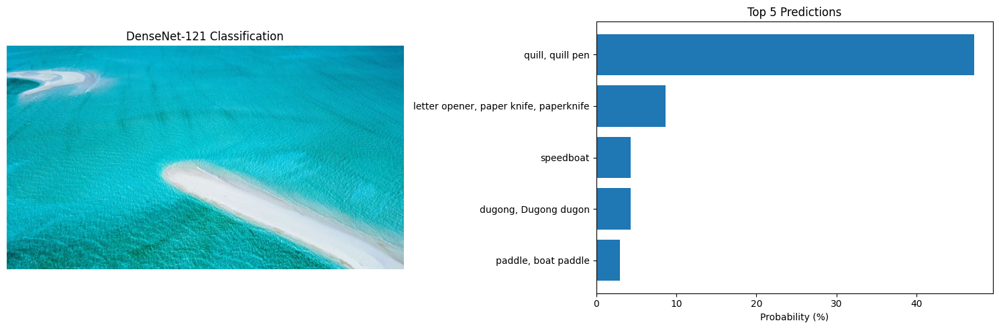

Top 5 predictions for image7.jpg using DenseNet-121:
1. quill, quill pen - 47.19%
2. letter opener, paper knife, paperknife - 8.70%
3. speedboat - 4.35%
4. dugong, Dugong dugon - 4.31%
5. paddle, boat paddle - 2.98%


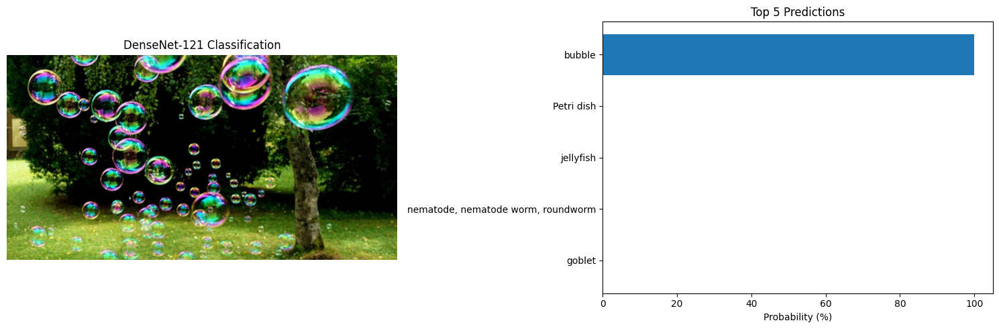

Top 5 predictions for image8.jpg using DenseNet-121:
1. bubble - 100.00%
2. Petri dish - 0.00%
3. jellyfish - 0.00%
4. nematode, nematode worm, roundworm - 0.00%
5. goblet - 0.00%


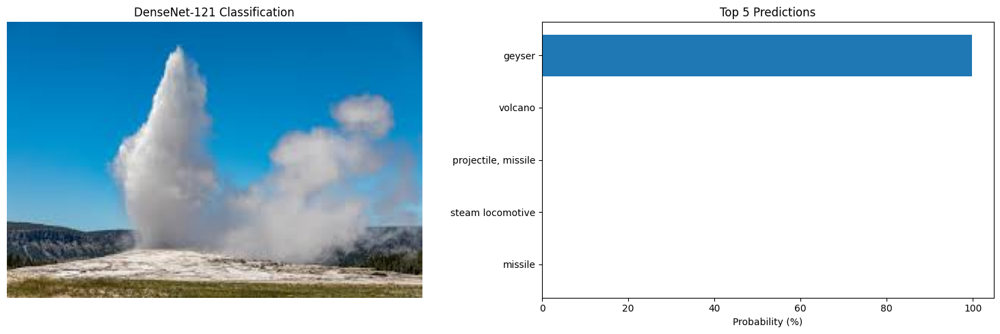

Top 5 predictions for image9.jpg using DenseNet-121:
1. geyser - 99.81%
2. volcano - 0.08%
3. projectile, missile - 0.02%
4. steam locomotive - 0.01%
5. missile - 0.01%


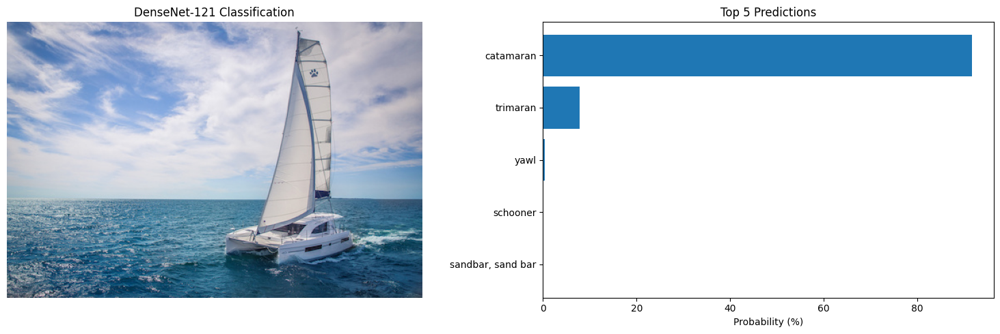

Top 5 predictions for image10.jpg using DenseNet-121:
1. catamaran - 91.77%
2. trimaran - 7.90%
3. yawl - 0.32%
4. schooner - 0.01%
5. sandbar, sand bar - 0.00%


In [29]:
for image_path in image_paths:
    visualize_top5_predictions(image_path, model_densenet121, "DenseNet-121")

## Question 2

### Define Training Data Loader

In [30]:
train_batch_size = 32
train_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(32, padding=4),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2470, 0.2435, 0.2616))
])

# Define training dataset and data loader
train_dataset = torchvision.datasets.CIFAR10(root='data/CIFAR-10', train=True,
                                            download=True, transform=train_transforms)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=train_batch_size,
                                          shuffle=True, num_workers=2)

### Define Model and Training Framework

Epoch [1/3]. Iter [1/1563]. Loss: 2.3704. Accuracy: 6.25
Epoch [1/3]. Iter [201/1563]. Loss: 1.4445. Accuracy: 50.00
Epoch [1/3]. Iter [401/1563]. Loss: 1.2873. Accuracy: 50.00
Epoch [1/3]. Iter [601/1563]. Loss: 1.4816. Accuracy: 43.75
Epoch [1/3]. Iter [801/1563]. Loss: 1.4257. Accuracy: 46.88
Epoch [1/3]. Iter [1001/1563]. Loss: 1.4059. Accuracy: 40.62
Epoch [1/3]. Iter [1201/1563]. Loss: 1.5478. Accuracy: 59.38
Epoch [1/3]. Iter [1401/1563]. Loss: 1.2667. Accuracy: 59.38
Epoch [2/3]. Iter [1/1563]. Loss: 1.1377. Accuracy: 53.12
Epoch [2/3]. Iter [201/1563]. Loss: 1.3675. Accuracy: 56.25
Epoch [2/3]. Iter [401/1563]. Loss: 0.9638. Accuracy: 65.62
Epoch [2/3]. Iter [601/1563]. Loss: 0.7300. Accuracy: 71.88
Epoch [2/3]. Iter [801/1563]. Loss: 1.0154. Accuracy: 68.75
Epoch [2/3]. Iter [1001/1563]. Loss: 0.8222. Accuracy: 75.00
Epoch [2/3]. Iter [1201/1563]. Loss: 0.8081. Accuracy: 75.00
Epoch [2/3]. Iter [1401/1563]. Loss: 0.9382. Accuracy: 71.88
Epoch [3/3]. Iter [1/1563]. Loss: 1.242

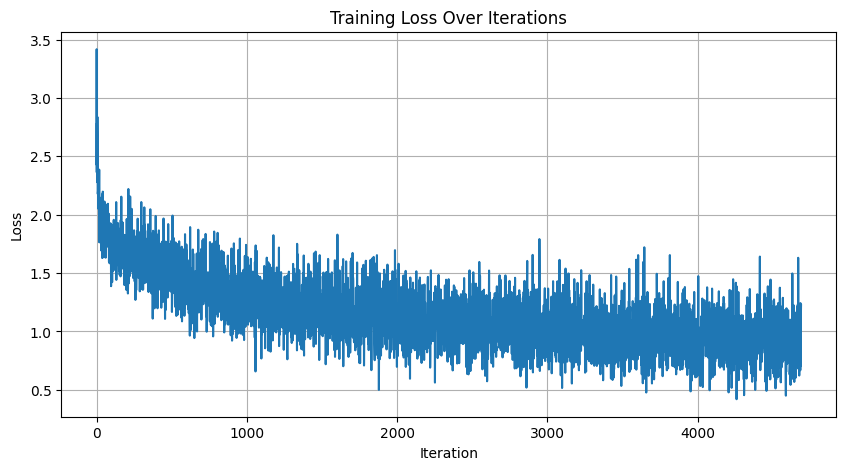

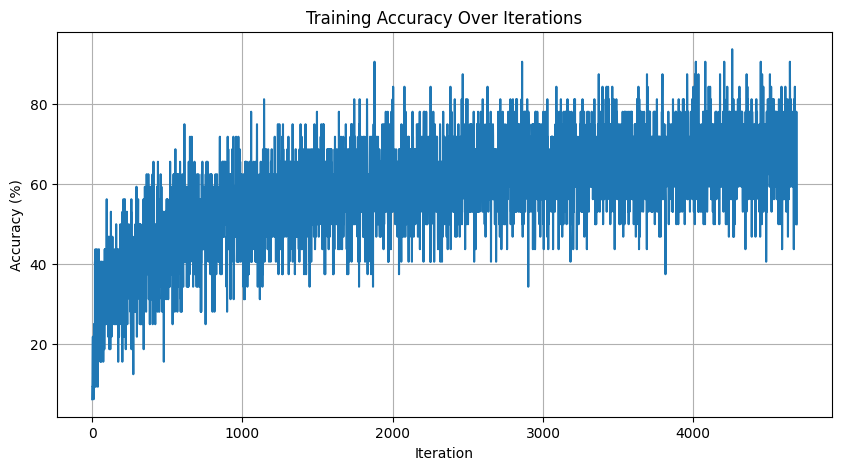

In [31]:
cuda = torch.cuda.is_available()
# model = None # Define a classification model for 10 classes
# Define a simple CNN for CIFAR-10
class CIFAR10CNN(nn.Module):
    def __init__(self):
        super(CIFAR10CNN, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)

        # Pooling layer
        self.pool = nn.MaxPool2d(2, 2)

        # Fully connected layers
        self.fc1 = nn.Linear(128 * 4 * 4, 512)
        self.fc2 = nn.Linear(512, 10)

        # Dropout
        self.dropout = nn.Dropout(0.2)

        # Batch normalization
        self.bn1 = nn.BatchNorm2d(32)
        self.bn2 = nn.BatchNorm2d(64)
        self.bn3 = nn.BatchNorm2d(128)

    def forward(self, x):
        # Apply convolution, batch norm, ReLU, and pooling
        x = self.pool(torch.relu(self.bn1(self.conv1(x))))
        x = self.pool(torch.relu(self.bn2(self.conv2(x))))
        x = self.pool(torch.relu(self.bn3(self.conv3(x))))

        # Flatten
        x = x.view(-1, 128 * 4 * 4)

        # Fully connected with dropout
        x = self.dropout(torch.relu(self.fc1(x)))
        x = self.fc2(x)

        return x

# Initialize the model
model_cifar10 = CIFAR10CNN()

if cuda:
  model_cifar10.cuda()

model_cifar10.train()
learning_rate = 0.001
num_epochs = 3
optim = torch.optim.Adam(model_cifar10.parameters(), lr = learning_rate)
loss_fn = nn.CrossEntropyLoss()
loss_logger = []
accuracy_logger = []

for epoch in range(1, num_epochs + 1):
  for it, (images, labels) in enumerate(train_loader):
      if cuda:
        images = images.cuda()
        labels = labels.cuda()

      # Write your code to computer outputs, loss, accuracy, and optimize model
      # outptus = ???
      # loss = ???
      # accuracy = ???
      # optimize the model
      # loss = None
      # accuracy = None
            # Forward pass
      outputs = model_cifar10(images)
      loss = loss_fn(outputs, labels)

      # Backward and optimize
      optim.zero_grad()
      loss.backward()
      optim.step()

      # Calculate accuracy
      _, predicted = torch.max(outputs.data, 1)
      total = labels.size(0)
      correct = (predicted == labels).sum().item()
      accuracy = correct / total * 100

      loss_logger.append(loss.item())
      accuracy_logger.append(accuracy)

      if it % 200 == 0:
        print("Epoch [%d/%d]. Iter [%d/%d]. Loss: %0.4f. Accuracy: %.2f" % (epoch, num_epochs, it + 1, len(train_loader), loss, accuracy))

torch.save(model_cifar10.state_dict(), "CIFAR10-Model.pth")

# Write your code to visualize the training losses over interations
plt.figure(figsize=(10, 5))
plt.plot(loss_logger)
plt.title('Training Loss Over Iterations')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.grid(True)
plt.show()

# Write your code to visualize the training accuracies over interations
plt.figure(figsize=(10, 5))
plt.plot(accuracy_logger)
plt.title('Training Accuracy Over Iterations')
plt.xlabel('Iteration')
plt.ylabel('Accuracy (%)')
plt.grid(True)
plt.show()

### Load Model and Evaluate Model On Testing Dataset

Iter [1/100]. Accuracy: 69.00
Final Accuracy: 69.52
Top 5 Accuracy: 0.970


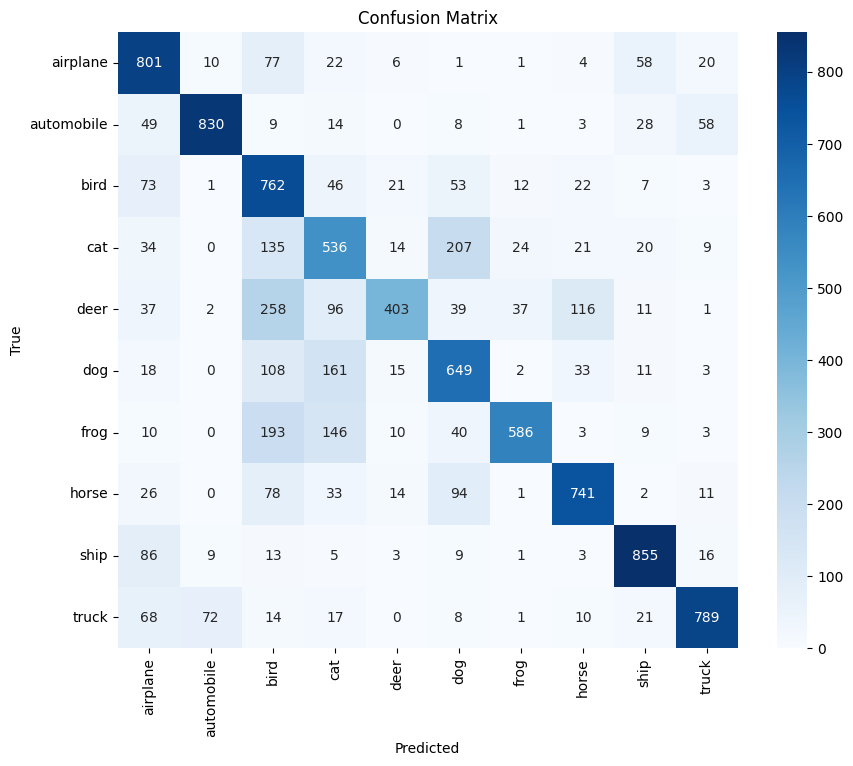

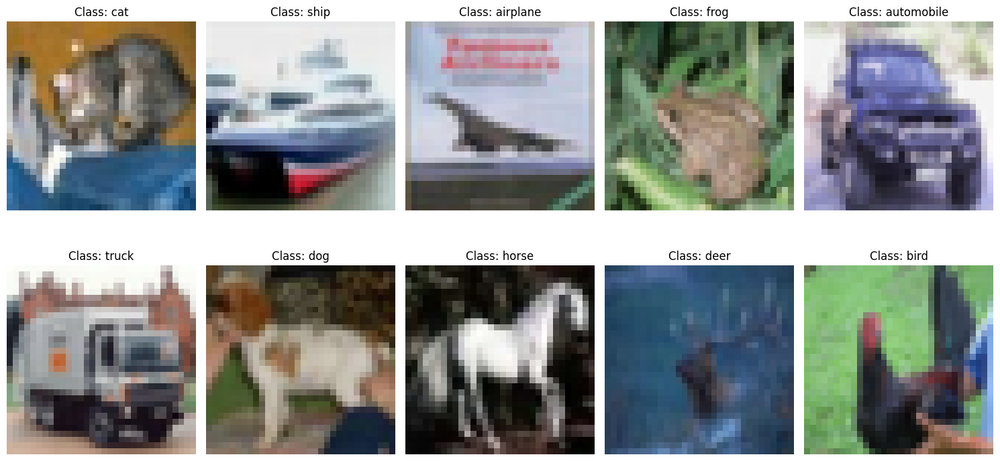

In [32]:
cuda = torch.cuda.is_available()
# model = # Define a classification model for 10 classes
model_cifar10 = CIFAR10CNN()
if cuda:
  model_cifar10.cuda()

# Load your trained model in the previous step
model_cifar10.load_state_dict(torch.load("CIFAR10-Model.pth"))
model_cifar10.eval()

# test_dataset = None # Define Testing Set of CIFAR-10
# test_loader = None # Define Testing Loader of CIFAR-10
# Define test dataset and loader
test_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2470, 0.2435, 0.2616))
])

test_dataset = torchvision.datasets.CIFAR10(root='data/CIFAR-10', train=False,
                                           download=True, transform=test_transforms)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=100,
                                         shuffle=False, num_workers=2)
all_predictions = []
all_labels = []

final_accuracy = 0.0
final_top_5_acuuracy = 0.0


for it, (images, labels) in enumerate(test_loader):
  if cuda:
    images = images.cuda()
    labels = labels.cuda()

    # Write your code to computer outputs, accuracy, and top 5 accuracy
    # outptus = ???
    # accuracy = ???
    # top_5_acuuracy = ???
    # accuracy = None
    # top_5_acuuracy = None
 # Forward pass
  outputs = model_cifar10(images)

  # Calculate accuracy
  _, predicted = torch.max(outputs.data, 1)
  total = labels.size(0)
  correct = (predicted == labels).sum().item()
  accuracy = correct / total * 100

  # Calculate top-5 accuracy
  _, top5_indices = torch.topk(outputs, 5, dim=1)
  batch_correct = 0
  for i in range(len(labels)):
      if labels[i] in top5_indices[i]:
          batch_correct += 1
  top_5_acuuracy = batch_correct / total * 100
  all_predictions.extend(predicted.cpu().numpy())
  all_labels.extend(labels.cpu().numpy())
  final_accuracy += accuracy
  final_top_5_acuuracy += top_5_acuuracy

  if it % 500 == 0:
    print("Iter [%d/%d]. Accuracy: %.2f" % (it + 1, len(test_loader), accuracy))

print("Final Accuracy: %0.2f" % (final_accuracy / len(test_loader)))
print("Top 5 Accuracy: %0.3f" % (top_5_acuuracy / len(test_loader)))

from sklearn.metrics import confusion_matrix
import numpy as np
import seaborn as sns

# CIFAR-10 class names
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
cm = confusion_matrix(all_labels, all_predictions)

# Write your code to visualize the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Write your code to visualize the correct predictions
def imshow(img):
    # Convert tensor to numpy array and unnormalize
    img = img.cpu().numpy().transpose((1, 2, 0))
    mean = np.array([0.4914, 0.4822, 0.4465])
    std = np.array([0.2470, 0.2435, 0.2616])
    img = std * img + mean
    img = np.clip(img, 0, 1)
    return img

# Get 10 correctly predicted samples (try to get one from each class if possible)
correct_samples = []
correct_labels = []
class_counts = {i: 0 for i in range(10)}  # Track count of each class

with torch.no_grad():
    for images, labels in test_loader:
        if cuda:
            images = images.cuda()
            labels = labels.cuda()

        outputs = model_cifar10(images)
        _, predicted = torch.max(outputs, 1)

        # Find correctly predicted samples
        for i in range(len(images)):
            if predicted[i] == labels[i] and class_counts[labels[i].item()] < 1:
                correct_samples.append(images[i].cpu())
                correct_labels.append(labels[i].item())
                class_counts[labels[i].item()] += 1

        # Check if we have at least one sample from each class
        if sum(class_counts.values()) >= 10:
            break

# Display the correctly predicted samples
plt.figure(figsize=(15, 8))
for i in range(min(10, len(correct_samples))):
    plt.subplot(2, 5, i+1)
    sample_img = imshow(correct_samples[i])
    plt.imshow(sample_img)
    plt.title(f"Class: {class_names[correct_labels[i]]}")
    plt.axis('off')
plt.tight_layout()
plt.show()